# Exemple of the datasets 

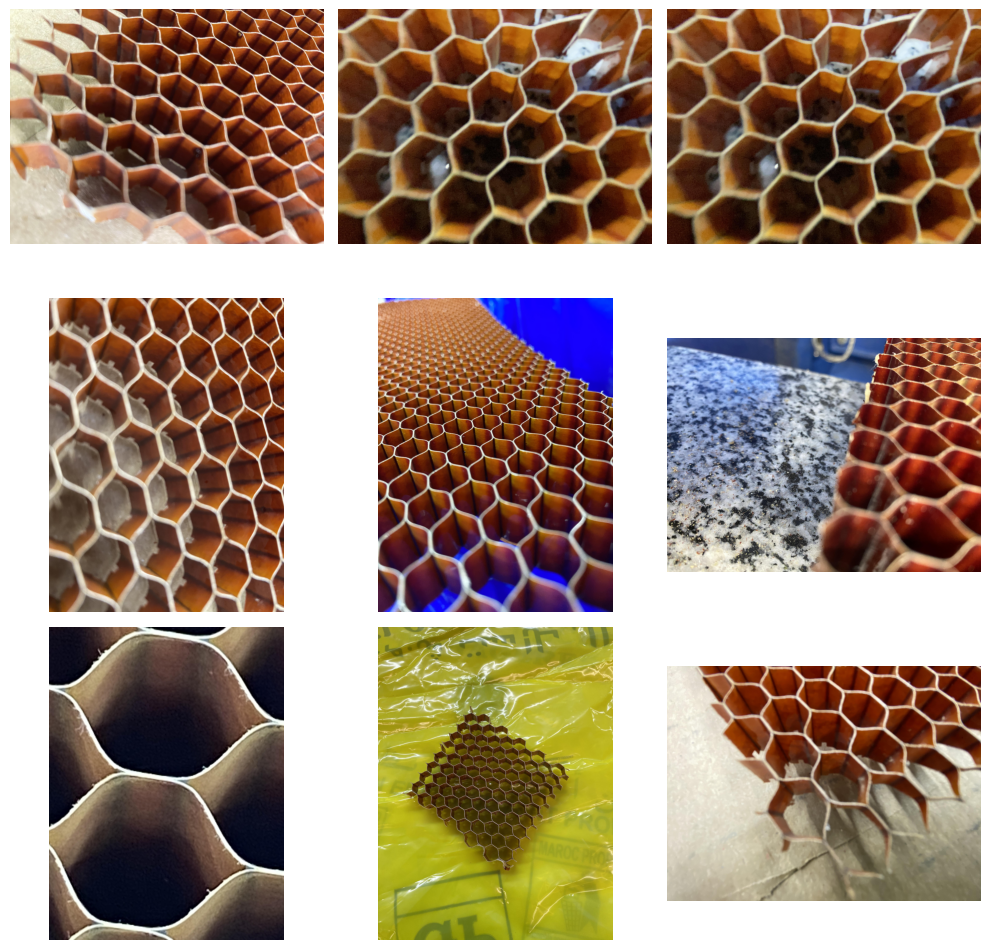

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import os
import random
from skimage import io

def plot_random_images(image_folder, num_images=9):
    # Get a list of all image files in the directory with supported formats
    all_images = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

    # Ensure there are enough images in the directory
    if len(all_images) < num_images:
        raise ValueError(f"Not enough images in the directory. Found {len(all_images)} images, need at least {num_images}.")

    # Select random images from the directory
    random_images = random.sample(all_images, num_images)

    # Create a grid (default 3x3 for 9 images)
    grid_size = int(np.sqrt(num_images))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

    for ax, img_name in zip(axes.flatten(), random_images):
        # Load image using skimage
        img_path = os.path.join(image_folder, img_name)
        img = io.imread(img_path)

        # Display the image and hide the axis
        ax.imshow(img)
        # ax.set_title(img_name, fontsize=10)  # Removed this line to not display the image name
        ax.axis('off')  # Hide axes ticks

    # Ensure the layout is adjusted
    plt.tight_layout()
    plt.show()

# Example usage in Kaggle environment
image_folder = '/kaggle/input/nidatt'
plot_random_images(image_folder)


# Convert COCO Annotations to YOLO Format

In [ ]:
import json
import os

def convert_coco_to_yolo_format(coco_json_path, output_dir):
    with open(coco_json_path, 'r') as f:
        coco_data = json.load(f)

    images = {image['id']: image for image in coco_data['images']}
    annotations = coco_data['annotations']
    categories = coco_data['categories']

    # Create a mapping from category ID to category name
    category_map = {category['id']: category['name'] for category in categories}

    os.makedirs(output_dir, exist_ok=True)

    for annotation in annotations:
        image_id = annotation['image_id']
        category_id = annotation['category_id'] - 1  # assuming 0-based class index
        bbox = annotation['bbox']  # [x, y, width, height]
        segmentation = annotation.get('segmentation', [])  # Assuming segmentation points are [px1, py1, px2, py2, ...]

        # Get image details
        image = images[image_id]
        image_width = image['width']
        image_height = image['height']
        image_filename = image['file_name']

        # Normalize bounding box coordinates
        x, y, width, height = bbox
        x /= image_width
        y /= image_height
        width /= image_width
        height /= image_height

        # Prepare segmentation points (assuming it's a single polygon for simplicity)
        keypoints_normalized = []
        if segmentation:
            for i in range(0, len(segmentation[0]), 2):  # Assuming segmentation points are [px1, py1, px2, py2, ...]
                kp_x = segmentation[0][i] / image_width
                kp_y = segmentation[0][i + 1] / image_height
                keypoints_normalized.extend([kp_x, kp_y])

        # Create annotation string
        annotation_str = f"{category_id} {x} {y} {width} {height} " + " ".join(map(str, keypoints_normalized))

        # Write to file
        annotation_filename = os.path.splitext(image_filename)[0] + '.txt'
        annotation_filepath = os.path.join(output_dir, annotation_filename)
        with open(annotation_filepath, 'a') as f:
            f.write(annotation_str + '\n')

# Example usage
coco_json_path = '/content/drive/MyDrive/polyv8/Nida_Datasets/valid/_annotations.coco.json'
output_dir = '/content/drive/MyDrive/polyv8/Nida_Datasets/valid/labels'
convert_coco_to_yolo_format(coco_json_path, output_dir)


# Import ultralytics library

In [ ]:
!pip install ultralytics



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/780.6 kB ? eta -:--:--
     ━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/780.6 kB 8.4 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 778.2/780.6 kB 10.4 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.6/780.6 kB 8.4 MB/s eta 0:00:00





































  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)


  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)


  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)


  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)


  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)


  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)


  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)


  Using cached nvidia_

# Summary of the model

In [ ]:
from ultralytics import YOLO

# Load the YOLOv8 model (e.g., yolov8n for YOLOv8 nano)
model = YOLO('yolov8x-pose.pt')

# Print the model architecture
print(model.model.yaml)

100%|██████████| 133M/133M [00:00<00:00, 312MB/s]


{'nc': 1, 'kpt_shape': [17, 3], 'scales': {'n': [0.33, 0.25, 1024], 's': [0.33, 0.5, 1024], 'm': [0.67, 0.75, 768], 'l': [1.0, 1.0, 512], 'x': [1.0, 1.25, 512]}, 'backbone': [[-1, 1, 'Conv', [64, 3, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'C2f', [128, True]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 6, 'C2f', [256, True]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 6, 'C2f', [512, True]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 3, 'C2f', [1024, True]], [-1, 1, 'SPPF', [1024, 5]]], 'head': [[-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 3, 'C2f', [512]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 3, 'C2f', [256]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 12], 1, 'Concat', [1]], [-1, 3, 'C2f', [512]], [-1, 1, 'Conv', [512, 3, 2]], [[-1, 9], 1, 'Concat', [1]], [-1, 3, 'C2f', [1024]], [[15, 18, 21], 1, 'Pose', ['nc', 'kpt_shape']]], 'scale': 'x', 'yaml_file': 'yolov8x-pose.yaml', 'ch': 3}


# Clear the cache

In [ ]:
import torch
torch.cuda.empty_cache()


# TRAIN

In [ ]:
from ultralytics import YOLO

# Load a pretrained YOLOv8 model for keypoint detection
model = YOLO("yolov8x-pose.pt")

# Train the model with the dataset configuration
results = model.train(
    data="/content/drive/MyDrive/polyv8/dataset640size/data.yaml",
    epochs=130,batch=10,workers = 5, imgsz=640)


100%|██████████| 133M/133M [00:00<00:00, 453MB/s] 


Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

engine/trainer: task=pose, mode=train, model=yolov8x-pose.pt, data=/content/drive/MyDrive/polyv8/dataset640size/data.yaml, epochs=130, time=None, patience=20, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=5, project=runs/segment, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.3, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

100%|██████████| 755k/755k [00:00<00:00, 127MB/s]


Overriding model.yaml kpt_shape=[17, 3] with kpt_shape=[6, 2]



                   from  n    params  module                                       arguments                     

  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 

  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               

  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           

  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              

  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           

  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              

  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           

  7            

100%|██████████| 6.23M/6.23M [00:00<00:00, 331MB/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)

  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/polyv8/dataset640size/train/labels.cache... 219 images, 1 backgrounds, 134 corrupt: 100%|██████████| 220/220 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/train/images/IMG_0527_JPG.rf.2e10c364ac66d858035511588a639256.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (69,) + inhomogeneous part.

train: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/train/images/IMG_0527_JPG.rf.8c7ba5656c808a5cfad1b0e87320829d.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (73,) + inhomogeneous part.

train: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/train/images/IMG_0532_JPG.rf.7b596df936ecc3891a3ec6d55c8355b9.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (16,) + inhomogeneous part.

train: WARNING ⚠️ /content/drive/MyDr

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  self.pid = os.fork()

val: Scanning /content/drive/MyDrive/polyv8/dataset640size/valid/labels.cache... 11 images, 0 backgrounds, 3 corrupt: 100%|██████████| 11/11 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/valid/images/IMG_1033_JPG.rf.22b2d74f35e70a8e7e996671496a8c48.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (155,) + inhomogeneous part.

val: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/valid/images/IMG_1215_PNG.rf.12a085428b8045948d68293fc7606498.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (88,) + inhomogeneous part.

val: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/valid/images/IMG_1383_JPG.rf.c36937dd32230653a500d76b8f02cba9.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (139,) + inhomogeneous part.


Plotting labels to runs/segment/train2/labels.jpg... 

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 

optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 103 weight(decay=0.0), 113 weight(decay=0.00046875), 112 bias(decay=0.0)

TensorBoard: model graph visualization added ✅

Image sizes 640 train, 640 val

Using 2 dataloader workers

Logging results to runs/segment/train2

Starting training for 130 epochs...



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/130        13G      4.028      10.32          0      4.268      3.077       1490        640: 100%|██████████| 9/9 [00:19<00:00,  2.16s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]

                   all          8        956      0.228      0.524      0.175     0.0667          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/130      12.3G      2.627      8.566          0      1.473      1.822       1235        640: 100%|██████████| 9/9 [00:12<00:00,  1.41s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all          8        956     0.0279     0.0701     0.0185    0.00722          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/130      11.3G      2.121      7.451          0      1.193      1.552        971        640: 100%|██████████| 9/9 [00:11<00:00,  1.31s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all          8        956     0.0279     0.0701     0.0185    0.00722          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/130      12.5G      1.943      7.014          0      1.128      1.503       1199        640: 100%|██████████| 9/9 [00:10<00:00,  1.13s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all          8        956     0.0279     0.0701     0.0185    0.00722          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/130      13.2G      1.912      6.761          0      1.048      1.463       1558        640: 100%|██████████| 9/9 [00:12<00:00,  1.40s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

                   all          8        956   0.000417    0.00105   0.000211   2.11e-05          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/130      11.8G       1.79      6.277          0       1.04      1.451        619        640: 100%|██████████| 9/9 [00:08<00:00,  1.09it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all          8        956    0.00167    0.00418    0.00084   0.000441          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/130      11.5G        1.9      6.592          0      1.051      1.388       1065        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all          8        956    0.00542     0.0136    0.00278    0.00085          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/130      11.3G      1.706      5.898          0      1.015      1.375        974        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all          8        956       0.14     0.0785     0.0394     0.0196     0.0038    0.00209   0.000773   7.73e-05




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/130      11.7G      1.685      5.877          0      1.025      1.362       1019        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all          8        956     0.0922      0.176     0.0509      0.014          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/130      11.2G      1.823      6.086          0      1.084      1.467        677        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all          8        956    0.00917      0.023    0.00469    0.00146          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/130      11.3G       1.75      5.656          0      1.051      1.397       1506        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all          8        956     0.0296     0.0743     0.0172    0.00222          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/130      11.3G      1.721      5.426          0      1.015      1.365       1078        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all          8        956     0.0204     0.0126    0.00739    0.00198    0.00334    0.00209    0.00111   0.000111




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/130      11.7G      1.821      5.642          0      1.021      1.362       1302        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all          8        956     0.0503      0.091     0.0246    0.00606    0.00404    0.00732    0.00169   0.000966




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/130        11G      1.811      5.706          0      1.041      1.473        906        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all          8        956     0.0075     0.0188    0.00401    0.00118          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/130      11.7G      1.758      5.912          0      1.034      1.374       1447        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all          8        956     0.0075     0.0188    0.00401    0.00118          0          0          0          0




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/130        12G      1.688      5.215          0     0.9865        1.3        903        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all          8        956      0.326      0.186      0.155     0.0457      0.103     0.0418     0.0205    0.00527




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/130        13G      1.591      4.975          0     0.9534      1.268       1368        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all          8        956      0.655      0.603       0.58      0.185     0.0834      0.105     0.0318    0.00834




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/130      12.2G       1.59      5.244          0     0.9114       1.26       1824        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all          8        956     0.0817      0.121     0.0592     0.0195     0.0323     0.0649     0.0168    0.00742




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/130        11G      1.652      5.147          0     0.9563      1.283       1252        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all          8        956      0.694      0.666      0.666      0.286      0.396      0.256      0.245      0.083




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/130      10.2G      1.548      4.912          0     0.9437      1.256       1510        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all          8        956       0.76      0.679       0.73      0.299      0.248      0.328      0.141     0.0444




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/130      12.4G      1.483      4.512          0     0.9035      1.233       1434        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all          8        956      0.761      0.758      0.769      0.319      0.239      0.256      0.133     0.0481




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/130      11.6G      1.447      4.078          0     0.8543      1.241       1013        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all          8        956      0.669      0.833      0.744      0.403      0.615      0.392      0.337      0.141




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/130      11.8G      1.476      4.653          0      0.909      1.214       1746        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all          8        956      0.622       0.76      0.687      0.358      0.543      0.306      0.247      0.138




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/130      11.1G      1.554       4.57          0     0.9199      1.247        832        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all          8        956      0.687      0.785      0.728      0.345      0.547      0.325      0.258      0.114




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/130      11.7G      1.499      4.561          0     0.9618      1.274        372        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all          8        956      0.727      0.816      0.753      0.351      0.641      0.373      0.346      0.151




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/130      11.4G      1.544      4.577          0     0.9288      1.252        487        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all          8        956       0.71      0.775      0.766       0.41      0.221      0.288      0.181     0.0808




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/130      10.4G      1.477      4.524          0     0.9493      1.247       1498        640: 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all          8        956      0.697      0.789      0.762      0.371      0.307      0.385      0.258      0.105




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/130      12.2G      1.377       4.08          0     0.8331      1.162       1899        640: 100%|██████████| 9/9 [00:08<00:00,  1.06it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all          8        956      0.529      0.593      0.428       0.19      0.232      0.361      0.148      0.084




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/130      12.9G      1.448      4.137          0      0.879      1.216        958        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all          8        956      0.119      0.276     0.0729     0.0327      0.113      0.264     0.0689     0.0297




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/130      11.3G      1.357          4          0     0.8464      1.163       1714        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all          8        956      0.546      0.628      0.612      0.331      0.689      0.331      0.393      0.173




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/130        12G      1.297      3.491          0     0.8102      1.147       1025        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all          8        956      0.768      0.573      0.653      0.354      0.727      0.392       0.41      0.225




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/130        10G      1.334      3.529          0     0.8391      1.191       1204        640: 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all          8        956      0.599      0.643       0.69      0.381       0.71      0.426      0.412      0.264




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/130      11.8G      1.373      3.633          0     0.8174      1.212        866        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all          8        956      0.727      0.515      0.655      0.349      0.655      0.395      0.365      0.214




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/130      11.7G      1.409      3.809          0     0.8425      1.212        959        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all          8        956      0.675      0.774      0.762      0.458      0.635      0.395      0.376      0.207




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/130      13.7G      1.395      3.704          0     0.8353      1.182        724        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all          8        956       0.78      0.751      0.787      0.477      0.557      0.366       0.34      0.196




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/130      12.7G       1.35      3.629          0     0.8092       1.15       1548        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all          8        956      0.749      0.861      0.831      0.484      0.695      0.408      0.403      0.317




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/130      11.8G      1.271      3.119          0     0.7819      1.119       1556        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all          8        956      0.749       0.86      0.838      0.503      0.724      0.418      0.419      0.319




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/130      12.4G       1.37      3.424          0     0.8337      1.151        614        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all          8        956      0.602      0.417      0.456      0.277      0.521      0.365      0.326      0.233




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/130      10.6G      1.311      3.397          0        0.8      1.174        569        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all          8        956      0.616      0.718       0.71        0.4      0.606      0.408      0.371      0.238




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/130      11.6G      1.329      3.318          0     0.8337      1.155       1383        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all          8        956      0.742      0.817      0.794      0.467      0.458       0.52      0.396      0.177




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/130      11.1G      1.239      2.869          0     0.7885      1.134       1228        640: 100%|██████████| 9/9 [00:07<00:00,  1.21it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all          8        956       0.81      0.879      0.854       0.46      0.498      0.528      0.447       0.22




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/130      11.4G       1.37      3.405          0     0.7995       1.16        698        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all          8        956       0.82      0.849      0.868      0.372       0.62      0.427      0.491      0.278




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/130      11.1G      1.272      2.959          0     0.7647      1.117        726        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all          8        956      0.803      0.863      0.866      0.447      0.632      0.403      0.433      0.318




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/130      12.3G      1.299      3.155          0     0.7703      1.135       1312        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all          8        956      0.812      0.878      0.881      0.527      0.548      0.397      0.378      0.245




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/130      11.7G      1.197      2.905          0     0.7135      1.078       1102        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all          8        956      0.815      0.894      0.896       0.52      0.549      0.379      0.375      0.255




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/130      9.96G      1.192       2.98          0     0.7444      1.129        913        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all          8        956      0.839      0.875      0.904      0.544      0.623      0.399      0.433      0.342




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/130      12.9G      1.201       3.09          0     0.7343      1.114        469        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all          8        956      0.836      0.865      0.893       0.53       0.63      0.405      0.451      0.329




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/130      11.9G      1.167      2.879          0     0.7044      1.075        953        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all          8        956      0.847      0.862      0.906      0.503      0.638      0.414       0.44      0.329




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/130      11.3G      1.171      2.807          0      0.713        1.1       1570        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all          8        956      0.857      0.864      0.913      0.511      0.602       0.41      0.408      0.322




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/130      11.2G      1.131      2.448          0     0.6596      1.052        737        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all          8        956      0.842      0.881      0.913      0.511      0.582      0.404      0.359      0.259




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/130      11.6G      1.178      2.704          0      0.727      1.111        484        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all          8        956      0.821      0.832      0.877      0.518      0.587       0.41      0.362      0.282




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/130      12.1G      1.211      2.743          0     0.7328      1.093       1206        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all          8        956      0.837      0.842      0.875       0.54      0.672      0.664      0.601      0.362




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/130      13.4G      1.107      2.398          0     0.6706      1.069       1906        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all          8        956       0.84      0.831      0.874       0.56      0.726      0.736      0.673        0.5




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/130      11.5G      1.068      2.437          0     0.6941      1.078        793        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all          8        956      0.845      0.846      0.893      0.524      0.752      0.759       0.74      0.531




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/130      11.1G      1.056      2.127          0      0.645      1.056        679        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all          8        956      0.846      0.853      0.902      0.523      0.733      0.728       0.73      0.524




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/130      13.7G      1.039      2.505          0     0.6211      1.027        987        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all          8        956      0.831      0.887      0.903      0.541      0.723      0.631      0.666      0.462




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/130      12.8G      1.084      2.351          0     0.6528      1.055        958        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all          8        956      0.831      0.894      0.895      0.508      0.732      0.426       0.51      0.373




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/130      11.5G      1.038      2.108          0       0.65      1.037       1786        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all          8        956      0.837      0.892      0.895      0.533      0.777      0.418      0.476      0.373




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/130      12.5G      1.139      2.353          0     0.6606      1.056       1730        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all          8        956      0.832      0.888      0.893      0.533      0.773      0.422      0.483      0.366




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/130      11.8G      1.082       2.34          0     0.6381      1.028        987        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all          8        956      0.841      0.869      0.896      0.547       0.76      0.407      0.494      0.356




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/130      10.9G       1.07      2.247          0     0.6433      1.043       1368        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all          8        956      0.871      0.865      0.901      0.519      0.555      0.541       0.51      0.375




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/130      12.4G      1.155      2.787          0     0.6879      1.075       1195        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all          8        956       0.85      0.873      0.912      0.521      0.609      0.554       0.54      0.375




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/130      11.5G      1.093      2.408          0     0.6769      1.031        563        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all          8        956      0.849      0.871      0.912      0.577      0.634      0.594      0.574      0.385




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/130      10.9G      1.045       2.11          0     0.6396      1.042        733        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all          8        956       0.85      0.845      0.909      0.568      0.744       0.73      0.702      0.495




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/130      11.7G      1.002      2.083          0     0.6236      1.028        684        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all          8        956      0.834      0.844      0.907      0.569      0.746      0.754      0.725      0.532




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/130      12.1G      1.004      1.998          0      0.611      1.011       1971        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all          8        956      0.864      0.796      0.895      0.604      0.767      0.705      0.708      0.481




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/130      11.6G     0.9946      1.958          0     0.5867     0.9969       1378        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all          8        956       0.88      0.807       0.91      0.597      0.791      0.726      0.744      0.493




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/130        11G      1.024      2.387          0     0.6242      1.036       1008        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all          8        956      0.879      0.862      0.936      0.565      0.808      0.792      0.802      0.574




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/130      10.7G      1.016      2.017          0      0.621      1.028        727        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all          8        956      0.918      0.845      0.941      0.574      0.838      0.776      0.801      0.566




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/130      12.3G      1.002      2.013          0     0.6105      1.026        902        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all          8        956       0.88      0.866      0.932      0.598        0.8       0.79      0.774      0.497




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/130      11.5G      1.003      1.971          0     0.6118      1.004       1468        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all          8        956      0.885      0.854      0.928       0.58      0.803       0.79      0.779      0.552




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/130      11.6G       1.08      2.391          0     0.6679      1.076        959        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all          8        956       0.87      0.834      0.902      0.519      0.802      0.773      0.766      0.522




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/130      12.3G     0.9689      1.848          0     0.5955     0.9989        933        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all          8        956      0.839      0.835      0.886      0.518      0.768      0.744      0.721      0.478




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/130      11.6G     0.9797       2.05          0      0.622       1.03       1367        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all          8        956      0.855      0.803      0.892      0.567      0.758      0.684      0.676      0.482




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/130      12.2G      1.036      2.071          0     0.6472      1.031       1875        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all          8        956       0.87      0.805      0.893      0.586      0.766      0.682      0.673      0.485




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/130      10.1G     0.9439      1.938          0     0.5768      1.003       1063        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all          8        956      0.902      0.851      0.932      0.582      0.862       0.73      0.754      0.557




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/130      10.7G     0.9747      1.885          0     0.6088       1.01       1037        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all          8        956      0.892      0.865      0.932      0.571      0.847      0.749      0.764       0.57




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/130      11.2G     0.9555      1.757          0     0.5779     0.9898       1048        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all          8        956       0.91      0.886      0.952      0.559      0.828      0.783      0.786      0.548




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/130      13.3G      0.923      1.943          0       0.57     0.9903       1540        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all          8        956      0.893      0.904      0.956      0.571       0.81      0.788       0.78      0.533




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/130      12.2G      0.983      1.907          0     0.6158      1.018       1393        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all          8        956      0.904      0.881      0.951       0.57      0.831      0.771      0.794      0.581




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/130      10.9G     0.9072      1.828          0     0.5761     0.9926        813        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all          8        956       0.92      0.869      0.947      0.571      0.831      0.779      0.798      0.581




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/130      11.2G     0.9529      1.928          0      0.577     0.9928        968        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all          8        956      0.915      0.871      0.947      0.572      0.829      0.789      0.798      0.565




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/130      10.6G     0.8769      1.649          0     0.5513     0.9765        968        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all          8        956      0.904      0.878      0.948      0.577      0.819      0.799      0.805        0.6




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/130      10.6G     0.8593      1.436          0     0.5559     0.9768       1215        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all          8        956      0.909       0.88      0.945      0.589      0.826      0.802      0.802      0.634




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/130      13.3G     0.9284      1.796          0     0.5625     0.9926        840        640: 100%|██████████| 9/9 [00:08<00:00,  1.11it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all          8        956      0.904       0.88      0.945      0.586      0.823        0.8      0.801      0.613




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/130      10.5G     0.8558      1.432          0     0.5383     0.9782       1433        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all          8        956       0.91      0.888      0.949      0.584      0.823       0.76      0.767      0.558




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/130        11G     0.8753      1.575          0     0.5393     0.9765        627        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all          8        956      0.906      0.888      0.948      0.569      0.748      0.627      0.637      0.458




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/130      11.8G     0.8755      1.581          0     0.5432     0.9827       1141        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all          8        956      0.908      0.886      0.948      0.566      0.725      0.463      0.505      0.388




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/130      11.4G     0.8604      1.632          0     0.5342     0.9738        993        640: 100%|██████████| 9/9 [00:07<00:00,  1.21it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all          8        956      0.911      0.888      0.948      0.569      0.688      0.414      0.464      0.374




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/130      13.2G      0.908      1.632          0     0.5585     0.9877       2157        640: 100%|██████████| 9/9 [00:08<00:00,  1.10it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all          8        956      0.908      0.878      0.947      0.563      0.616      0.471      0.495      0.384




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/130        12G     0.8468      1.455          0     0.5361     0.9805        413        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all          8        956      0.894      0.883      0.944      0.556      0.655       0.58       0.58      0.427




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/130      9.82G     0.8393       1.35          0     0.5422     0.9811        987        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all          8        956        0.9      0.868      0.933      0.562      0.821      0.783      0.785      0.598




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/130      11.1G     0.8682      1.529          0     0.5353     0.9869       1126        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all          8        956      0.897      0.874      0.935      0.563      0.819      0.804      0.799      0.631




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/130      12.6G      0.906      1.595          0     0.5363     0.9743       1077        640: 100%|██████████| 9/9 [00:08<00:00,  1.11it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all          8        956      0.904      0.872      0.944      0.565      0.831      0.813      0.809      0.602




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/130      10.6G     0.8269      1.556          0     0.5088     0.9662       1588        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all          8        956       0.93       0.87      0.947      0.576      0.845       0.81      0.817      0.615




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/130      11.1G      0.817      1.301          0     0.5178     0.9677       1459        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all          8        956      0.919      0.896      0.957      0.608      0.844      0.816      0.818      0.668




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/130      11.8G     0.8621      1.568          0     0.5412     0.9973        651        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all          8        956       0.92      0.892      0.958      0.611      0.838       0.81      0.812      0.665




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/130      12.3G     0.8608      1.632          0     0.5233     0.9773        688        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all          8        956      0.914      0.902      0.956      0.597      0.816      0.789      0.771      0.596




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/130      14.7G     0.8795      1.717          0     0.5384     0.9718       1000        640: 100%|██████████| 9/9 [00:08<00:00,  1.11it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all          8        956      0.914        0.9      0.958      0.598      0.794      0.776      0.743      0.548




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/130      12.5G     0.8223      1.492          0     0.5111     0.9578       1324        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all          8        956      0.907      0.905      0.961      0.604      0.743      0.734      0.685      0.521




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    101/130      11.7G     0.8401      1.481          0     0.5094     0.9676        715        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all          8        956      0.909      0.906      0.961      0.605      0.752       0.74      0.691      0.535




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    102/130      10.4G     0.8034      1.228          0     0.5319     0.9751        685        640: 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all          8        956      0.926      0.906      0.965      0.615      0.803      0.785      0.753      0.601




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    103/130        11G     0.8205      1.444          0      0.508     0.9536        806        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all          8        956      0.923      0.906      0.964      0.614      0.809      0.776      0.757      0.613




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    104/130        12G     0.7902      1.279          0      0.499     0.9609        906        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all          8        956       0.93      0.891      0.959      0.604      0.822      0.775      0.771       0.63




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    105/130      10.5G     0.8507      1.663          0     0.5325     0.9867       1047        640: 100%|██████████| 9/9 [00:07<00:00,  1.19it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all          8        956      0.924      0.891       0.96      0.598      0.815      0.785      0.781       0.63




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    106/130      11.3G     0.7611      1.279          0     0.4763     0.9538       1263        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all          8        956      0.911      0.904      0.959      0.581       0.83      0.799      0.806      0.636




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    107/130      11.5G     0.7953      1.325          0     0.5008      0.964        534        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all          8        956      0.916      0.902      0.954      0.582      0.834      0.821      0.819      0.644




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    108/130      11.5G     0.8346      1.557          0     0.5132     0.9689       1319        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all          8        956       0.92      0.909      0.959      0.608      0.834      0.832      0.828      0.668




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    109/130      11.7G     0.8131      1.355          0     0.5188     0.9724       1272        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all          8        956      0.923      0.903      0.958      0.618      0.836      0.835      0.832      0.675




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    110/130      11.3G     0.7933      1.341          0     0.4969     0.9518       1577        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all          8        956      0.917      0.904      0.955      0.619      0.843      0.841       0.84      0.689




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    111/130      12.7G     0.8326      1.293          0     0.5138     0.9676       1200        640: 100%|██████████| 9/9 [00:08<00:00,  1.11it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all          8        956      0.921      0.907      0.955      0.614      0.847       0.84      0.841      0.691




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    112/130      12.2G      0.808      1.296          0      0.494     0.9538       2259        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all          8        956      0.921      0.909      0.953      0.601      0.855      0.844      0.847      0.678




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    113/130      14.5G     0.8458       1.55          0     0.5094     0.9691        769        640: 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all          8        956       0.92      0.911      0.956      0.597      0.853      0.845       0.85      0.673




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    114/130      11.7G     0.7843      1.284          0     0.4809     0.9467       1083        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all          8        956      0.923      0.908      0.955      0.587      0.848      0.834      0.841      0.662




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    115/130      11.1G     0.8396      1.403          0     0.5393     0.9864        727        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all          8        956      0.924      0.905      0.955      0.588      0.849      0.832      0.842       0.66




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    116/130      10.9G     0.8183      1.604          0      0.497     0.9598       1082        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all          8        956      0.927      0.905      0.959      0.593      0.839      0.837      0.842      0.658




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    117/130      11.1G     0.7687      1.246          0     0.4873     0.9535        809        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all          8        956      0.926      0.904       0.96      0.598      0.832      0.838      0.836      0.647




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    118/130        12G     0.8042      1.252          0        0.5     0.9791        611        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all          8        956      0.924      0.905      0.959      0.602      0.818      0.834      0.823      0.633




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    119/130        12G     0.7725      1.227          0     0.4839     0.9474       1308        640: 100%|██████████| 9/9 [00:07<00:00,  1.17it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all          8        956      0.922      0.906      0.959      0.604      0.824      0.814      0.812      0.627




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    120/130      10.2G     0.7557      1.217          0      0.483      0.961        990        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all          8        956      0.922      0.904      0.959      0.604      0.819      0.811      0.805      0.626


Closing dataloader mosaic

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  self.pid = os.fork()




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    121/130      10.8G      0.711     0.9156          0     0.5287     0.9291        724        640: 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

                   all          8        956      0.921      0.905       0.96      0.606      0.812      0.804      0.794      0.621




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    122/130      10.1G     0.6807     0.8449          0     0.4937     0.9064        238        640: 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all          8        956      0.911      0.913      0.959      0.605      0.798      0.806       0.78      0.618




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    123/130      10.9G      0.672     0.7641          0     0.4584     0.9198        339        640: 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all          8        956      0.911      0.906      0.957      0.603      0.772      0.776      0.743        0.6




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    124/130      9.55G     0.6738      0.955          0     0.4646     0.9126        396        640: 100%|██████████| 9/9 [00:08<00:00,  1.12it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all          8        956      0.916      0.894      0.955      0.605      0.772      0.795       0.75      0.605




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    125/130      10.2G     0.6972     0.9514          0     0.4992     0.9177        390        640: 100%|██████████| 9/9 [00:07<00:00,  1.14it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all          8        956      0.915      0.893      0.953      0.607      0.783      0.808      0.764      0.612




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    126/130       9.4G     0.7017     0.8087          0     0.4829     0.9159        322        640: 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all          8        956      0.916       0.89       0.95      0.606      0.761      0.779      0.733      0.591




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    127/130      10.2G     0.6465     0.7883          0     0.4412     0.9027        802        640: 100%|██████████| 9/9 [00:07<00:00,  1.21it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all          8        956      0.917       0.89      0.951      0.606       0.76      0.779      0.733       0.59




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    128/130      9.98G     0.6513     0.7073          0     0.4439     0.8933        704        640: 100%|██████████| 9/9 [00:07<00:00,  1.23it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all          8        956      0.914      0.889      0.948      0.607      0.757      0.772      0.727      0.585




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    129/130       9.4G     0.6834     0.9977          0     0.4648     0.9151        640        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all          8        956      0.914       0.89      0.948      0.607      0.744      0.753      0.713      0.572




      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    130/130      10.2G     0.6381     0.8586          0     0.4394     0.8955        327        640: 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all          8        956      0.915      0.889      0.948      0.605      0.757      0.758      0.723      0.581

EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 110, best model saved as best.pt.

To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.




130 epochs completed in 0.475 hours.

Optimizer stripped from runs/segment/train2/weights/last.pt, 139.4MB

Optimizer stripped from runs/segment/train2/weights/best.pt, 139.4MB



Validating runs/segment/train2/weights/best.pt...

Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

YOLOv8x-pose summary (fused): 287 layers, 69452727 parameters, 0 gradients, 263.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


                   all          8        956      0.917      0.904      0.955      0.619      0.843      0.838       0.84      0.689

Speed: 0.3ms preprocess, 33.9ms inference, 0.0ms loss, 4.1ms postprocess per image

Results saved to runs/segment/train2


# validation

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("/content/drive/MyDrive/polyv8/yolov8x-pose.pt")  # load an official model
model = YOLO("/content/drive/MyDrive/polyv8/runs/pose/train11/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75

Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)

YOLOv8x-pose summary (fused): 287 layers, 69452727 parameters, 0 gradients, 263.2 GFLOPs



100%|██████████| 755k/755k [00:00<00:00, 4.10MB/s]

val: Scanning /content/drive/MyDrive/polyv8/dataset640size/valid/labels.cache... 11 images, 0 backgrounds, 3 corrupt: 100%|██████████| 11/11 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/valid/images/IMG_1033_JPG.rf.22b2d74f35e70a8e7e996671496a8c48.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (155,) + inhomogeneous part.

val: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/valid/images/IMG_1215_PNG.rf.12a085428b8045948d68293fc7606498.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (88,) + inhomogeneous part.

val: WARNING ⚠️ /content/drive/MyDrive/polyv8/dataset640size/valid/images/IMG_1383_JPG.rf.c36937dd32230653a500d76b8f02cba9.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (139,) + inhomogeneous part.




                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:56<00:00, 56.02s/it]


                   all          8        956      0.622      0.853      0.759      0.422      0.744      0.421      0.421      0.235

Speed: 7.5ms preprocess, 6203.6ms inference, 0.0ms loss, 11.5ms postprocess per image

Results saved to runs/pose/val


0.3870512740931439

# PREDICT




0: 640x480 199 Annotation-nidas, 2988.2ms

Speed: 4.0ms preprocess, 2988.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 480)


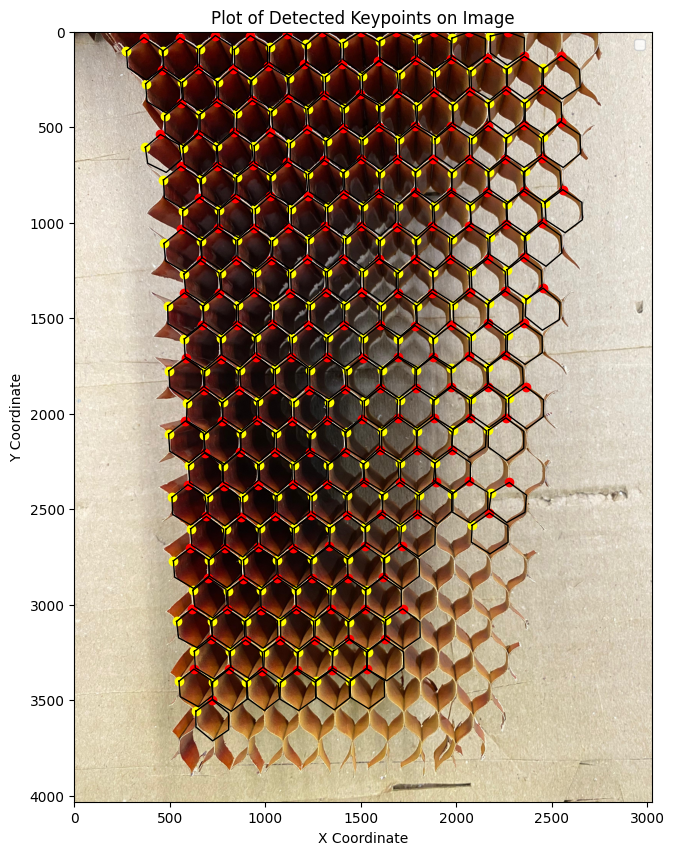

In [21]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
image_path = "/kaggle/input/uuuuoooo/test5.jpg"

# Load the model
model = YOLO("/kaggle/input/polyv8/best.pt")  # load a custom model

# Run inference on the image
results = model([image_path])

# Extract keypoints from the first result
keypoints_in_pixel = results[0].keypoints.xy

# Ensure keypoints are in numpy array format if they are tensors
if isinstance(keypoints_in_pixel, torch.Tensor):
    keypoints_in_pixel = keypoints_in_pixel.cpu().numpy()

# Load the original image
image = cv2.imread(image_path)

# Convert the image from BGR (OpenCV format) to RGB (Matplotlib format)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot the image
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)

# Iterate through each set of keypoints
for keypoints in keypoints_in_pixel:
    # Convert keypoints to a list of tuples
    keypoints_list = [(point[0], point[1]) for point in keypoints]

    # Plot the keypoints
    x_coords, y_coords = zip(*keypoints_list)
    plt.scatter(x_coords, y_coords,marker='.', c="none")  # Plot all points in gray

    # Highlight the first and last points
    plt.scatter(x_coords[0], y_coords[0], c='yellow',marker='o')  # First point in green
    plt.scatter(x_coords[-1], y_coords[-1], c='red',marker='o')  # Last point in blue

    # Draw lines connecting the points to form a hexagon if at least 6 points are available
    if len(keypoints_list) >= 6:
        hexagon_coords = keypoints_list[:6] + [keypoints_list[0]]  # Close the hexagon by adding the first point at the end
        hexagon_x, hexagon_y = zip(*hexagon_coords)
        plt.plot(hexagon_x, hexagon_y, c='black', linestyle='-', linewidth=1)

# Adding labels and title
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Plot of Detected Keypoints on Image')
plt.legend()
plt.savefig('/kaggle/working/test33_result.png')  # Adjust the path and filename as needed

# Show the plot
plt.show()


In [3]:
from ultralytics import YOLO

import matplotlib.pyplot as plt
import cv2
import numpy as np


# Load a model
model = YOLO("/kaggle/input/polyv8/best.pt")  # load a custom model

# Run batched inference on a list of images
results = model(["/kaggle/input/uuuuoooo/test3.jpg"])  # return a list of Results objects

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result.jpg")  # save to disk
keypoints_in_pixel = results[0].keypoints.xy
keypoints_in_pixel=keypoints_in_pixel.cpu().tolist()




0: 640x544 300 Annotation-nidas, 3912.8ms

Speed: 19.5ms preprocess, 3912.8ms inference, 28.5ms postprocess per image at shape (1, 3, 640, 544)


Error: no "view" mailcap rules found for type "image/png"

/usr/bin/xdg-open: 869: www-browser: not found

/usr/bin/xdg-open: 869: links2: not found

/usr/bin/xdg-open: 869: elinks: not found

/usr/bin/xdg-open: 869: links: not found

/usr/bin/xdg-open: 869: lynx: not found

/usr/bin/xdg-open: 869: w3m: not found

xdg-open: no method available for opening '/tmp/tmpa1n5zira.PNG'


# **Calculate the area **

In [4]:
import numpy as np
from shapely.geometry import Polygon
# Function to calculate the area of a hexagon given its vertices
def calculate_hexagon_area(vertices):
    # # Extract x and y coordinates
    # x = [vertex[0] for vertex in vertices]
    # y = [vertex[1] for vertex in vertices]
    
    # # Calculate the area using the shoelace formula
    # area = 0.5 * np.abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1)))
    polygon =Polygon(vertices)
    return polygon.area

# Given list of hexagonal coordinates
hexagons = keypoints_in_pixel
# Threshold area value input by user
area_threshold = 14000

# Calculate areas and filter hexagons
filtered_hexagons = []
for hexagon in hexagons:
    area = calculate_hexagon_area(hexagon)
    if area >= area_threshold:
        filtered_hexagons.append(hexagon)


# Update the original hexagons list
hexagons = filtered_hexagons

# Print the number of remaining hexagons
print(f"Number of hexagons after filtering: {len(hexagons)}")


Number of hexagons after filtering: 289


# **Calculate centroid with desired id**

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to calculate the centroid of two points
def calculate_centroid(point1, point2):
    return [(point1[0] + point2[0]) / 2, (point1[1] + point2[1]) / 2]

# Given list of hexagonal coordinates (example data)
hexagons = filtered_hexagons

# Initialize a list to hold the centroid coordinates with their IDs
centroid_data_with_ids = []

# Loop through each hexagon
for hexagon_index, hexagon in enumerate(hexagons):
    # Loop through each segment in the hexagon
    for i in range(len(hexagon)):
        # Calculate the centroid of the current segment
        point1 = hexagon[i]
        point2 = hexagon[(i + 1) % len(hexagon)]
        centroid = calculate_centroid(point1, point2)
        
        # Assign the ID (1 to 6 for each hexagon)
        id_ = (i % 6) + 1
        
        # Append the centroid coordinates, ID, and hexagon index to the list
        centroid_data_with_ids.append({
            'id': id_,
            'center': centroid,
            'hexagon_index': hexagon_index  # Track which hexagon this centroid belongs to
        })

# Function to extract centroids for a specific hexagon ID
def get_centroids_by_id(hexagon_id):
    centroids_list = []
    for hexagon_index, hexagon in enumerate(hexagons):
        centroids = [data['center'] for data in centroid_data_with_ids 
                     if data['hexagon_index'] == hexagon_index and data['id'] == hexagon_id]
        centroids_list.extend(centroids)
    return centroids_list

# Function to plot centroids for a specific hexagon ID across all hexagons on an input image
def plot_centroids_on_image(image_path, hexagon_id):
    # Load the input image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    
    # Get centroids for the specified hexagon ID
    centroids = get_centroids_by_id(hexagon_id)
    
    if centroids:
        centroids_x, centroids_y = zip(*centroids)
        plt.scatter(centroids_x, centroids_y, marker='.')
    
    plt.title(f'Centroids for ID {hexagon_id}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

    # Return the list of centroids
    return centroids

# Example: Plot centroids for hexagon ID 1 on an input image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'  # Replace with your image path
# mongitudinal
centroids_id_1=get_centroids_by_id(1)
#diagonal left /
centroids_id_2=get_centroids_by_id(2)
centroids_id_5 = get_centroids_by_id(5) 
# diagonal right\
centroids_id_3=get_centroids_by_id(3)
centroids_id_6=get_centroids_by_id(6)


# **Sort the list of centroid and group them in list based on y**

In [6]:
from collections import defaultdict

# Example list of coordinates (replace with your actual data)
centroids_id_1 = centroids_id_1
centroids_id_2 = centroids_id_2
centroids_id_5 = centroids_id_5
centroids_id_3 = centroids_id_3
centroids_id_6 = centroids_id_6
# center=centroids

def group_coordinates_by_y(coordinates):
    # Sort coordinates by y-coordinate
    coordinates.sort(key=lambda coord: coord[1])
    
    grouped_coordinates = []
    current_group = []
    last_y = None
    
    for x, y in coordinates:
        if last_y is None or abs(y - last_y) <= 50:  # Adjust the tolerance as needed
            current_group.append((x, y))
        else:
            grouped_coordinates.append(current_group)
            current_group = [(x, y)]
        last_y = y
    
    if current_group:
        grouped_coordinates.append(current_group)
    
    # Sort each group by x-coordinate to maintain horizontal order
    for group in grouped_coordinates:
        group.sort(key=lambda coord: coord[0])
    
    # Sort the grouped coordinates by the maximum y-coordinate in each group in decreasing order
    grouped_coordinates.sort(key=lambda group: max(coord[1] for coord in group), reverse=True)
    
    return grouped_coordinates

# Group coordinates by y-coordinate
grouped_coordinates1 = group_coordinates_by_y(centroids_id_1)
grouped_coordinates2 = group_coordinates_by_y(centroids_id_2)
grouped_coordinates5 = group_coordinates_by_y(centroids_id_5)
grouped_coordinates6 = group_coordinates_by_y(centroids_id_6)
grouped_coordinates3 = group_coordinates_by_y(centroids_id_3)
# grouped_coordinatescenter = group_coordinates_by_y(center)
Centroid1=[]
Centroid2=[]
Centroid5=[]
Centroid6=[]
Centroid3=[]
Center=[]
# Output the grouped coordinates
for i, group in enumerate(grouped_coordinates1):
    Centroid1.append(group)
for i, group in enumerate(grouped_coordinates2):
    Centroid2.append(group)
for i, group in enumerate(grouped_coordinates5):
    Centroid5.append(group)
for i, group in enumerate(grouped_coordinates3):
    Centroid3.append(group)
for i, group in enumerate(grouped_coordinates6):
    Centroid6.append(group)
# for i, group in enumerate(grouped_coordinatescenter):
#     Center.append(group)

**Sorted centroid with method sequene increse decresase**

In [1]:
# Example list of coordinates
coordinates_lists = Centroid1

Sorted_centroid1=[]
# Initialize an empty list to store the sorted sequences
sorted_sequences = []

# Process each list of coordinates
for i, coordinates in enumerate(coordinates_lists):
    # Sort coordinates based on x-coordinate
    sorted_coordinates = sorted(coordinates, key=lambda coord: coord[0])
    
    # Alternately append to sorted_sequences
    if i % 2 == 0:
        sorted_sequences.append(sorted_coordinates)  # Increasing order
    else:
        sorted_sequences.append(sorted_coordinates[::-1])  # Decreasing order

# Output the sorted sequences
print("Coordinates in Sorted Sequences:")
for sequence in sorted_sequences:
    Sorted_centroid1.append(sequence)

print(Sorted_centroid1)

NameError: name 'Centroid1' is not defined

# **trjectory**

**add point to deplace betwen lists**

In [17]:
# Example list of lists with coordinates
coordinates_lists = Sorted_centroid1
max_x = 0  # Start with negative infinity
min_x = 0   # Start with positive infinity

# Iterate through each sublist in coordinates_lists
for sublist in coordinates_lists:
    for coord in sublist:
        x_value = coord[0]  # Get the x-coordinate of the current point
        if x_value > max_x:
            max_x = x_value  # Update maximum x if current x is greater
        if x_value < min_x:
            min_x = x_value  # Update minimum x if current x is smaller

modified_sequences = []

# Process each pair of consecutive lists of coordinates
for i in range(len(coordinates_lists) - 1):
    # First list
    first_list = coordinates_lists[i]
    # Second list
    second_list = coordinates_lists[i + 1]
    
    # Add the first list to the modified sequences
    modified_sequences.append(first_list)
    
    # Calculate new points
    if i % 2 == 0:
        # Add point extended horizontally by 400px
#         last_x_first = first_list[-1][0]
        new_point1 = (max_x + 300, first_list[-1][1])
        
        # Add point extended horizontally by 400px to next list
        new_point2 = (max_x + 300, second_list[0][1])
    else:
        # Add point extended horizontally by -250px
#         last_x_first = first_list[-1][0]
        new_point1 = (min_x - 150, first_list[-1][1])
        
        # Add point extended horizontally by -250px to next list
        new_point2 = (min_x - 150, second_list[0][1])
    
    # Add the new points to the modified sequences
    modified_sequences.append([new_point1, new_point2])

# Add the last list to the modified sequences
modified_sequences.append(coordinates_lists[-1])
longitudinal=[]
# Output the modified sequences
print("list created")
for sequence in modified_sequences:
    longitudinal.append(sequence)
first_point=(longitudinal[0][0][0]-300,longitudinal[0][0][1])
last_point=(longitudinal[-1][-1][0]+300,longitudinal[-1][-1][1])
longitudinal.append([last_point])
longitudinal.insert(0, [first_point])
longitudinal

list created


[[(105.41777038574219, 3499.7274169921875)],
 [(405.4177703857422, 3499.7274169921875),
  (547.6600341796875, 3503.3013916015625),
  (695.2622680664062, 3502.23486328125),
  (854.4332885742188, 3504.6180419921875),
  (1016.4946594238281, 3508.651611328125),
  (1172.1572875976562, 3523.3331298828125),
  (1337.8616333007812, 3514.71630859375),
  (1504.99072265625, 3512.064208984375),
  (1671.5962524414062, 3510.385009765625),
  (1846.939208984375, 3502.4642333984375),
  (2030.4102783203125, 3501.1939697265625),
  (2210.717529296875, 3489.125732421875),
  (2399.399658203125, 3482.929931640625),
  (2596.5579833984375, 3468.434814453125)],
 [(3046.1942138671875, 3468.434814453125),
  (3046.1942138671875, 3308.775634765625)],
 [(2679.862548828125, 3308.775634765625),
  (2479.0078125, 3324.248291015625),
  (2290.8377685546875, 3337.6793212890625),
  (2114.091552734375, 3339.69775390625),
  (1934.1865844726562, 3345.48681640625),
  (1747.5860595703125, 3351.3150634765625),
  (1577.78515625, 33

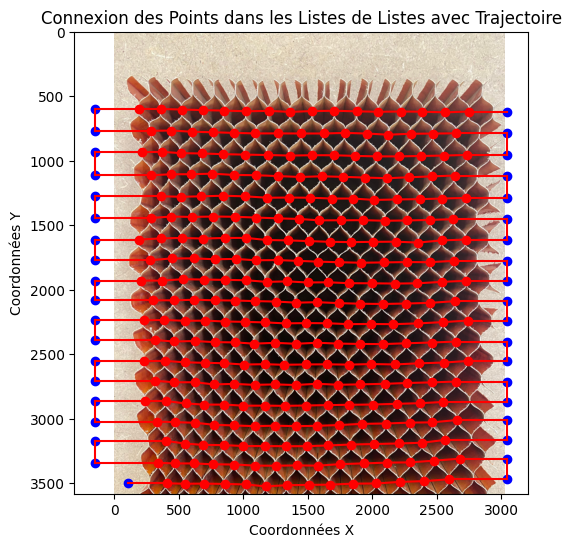

In [16]:
import matplotlib.pyplot as plt
from PIL import Image

# Example list of lists with coordinates
coordinates_lists = longitudinal

# Flatten the list of lists into a single list of coordinates
all_coordinates = [coord for sublist in coordinates_lists for coord in sublist]

# Separate the coordinates into x and y components
x_coords, y_coords = zip(*all_coordinates)

# Load your input image (replace 'input_image.jpg' with your image path)
input_image = Image.open('/kaggle/input/uuuuoooo/test3.jpg')

# Plot the image
plt.figure(figsize=(10, 6))
plt.imshow(input_image)

# Plot the points without connecting them initially
for sublist in coordinates_lists:
    sublist_x, sublist_y = zip(*sublist)
    if len(sublist) <= 2:
        plt.scatter(sublist_x, sublist_y, color='blue')  # Use blue for lists with 1 or 2 points
    else:
        plt.scatter(sublist_x, sublist_y, color='red')  # Use red for other lists

# Connect the points with lines in corresponding colors
for sublist in coordinates_lists:
    sublist_x, sublist_y = zip(*sublist)
    if len(sublist) <= 2:
        plt.plot(sublist_x, sublist_y, linestyle='-', color='red')  # Connect points with blue lines
    else:
        plt.plot(sublist_x, sublist_y, linestyle='-', color='red')  # Connect points with red lines

# Connect the blue and red points with the same trajectory line
for i in range(len(coordinates_lists) - 1):
    sublist1 = coordinates_lists[i]
    sublist2 = coordinates_lists[i + 1]
    
    # Check if sublist1 and sublist2 have at least one point each
    if sublist1 and sublist2:
        # Get the last point of sublist1 and the first point of sublist2
        x_values = [sublist1[-1][0], sublist2[0][0]]
        y_values = [sublist1[-1][1], sublist2[0][1]]
        
        # Determine the line color based on sublist1's length
        if len(sublist1) <= 2:
            line_color = 'red'
        else:
            line_color = 'red'
        
        # Plot the trajectory line between sublist1's last point and sublist2's first point
        plt.plot(x_values, y_values, linestyle='-', color=line_color)

plt.xlabel('Coordonnées X')
plt.ylabel('Coordonnées Y')
plt.title('Connexion des Points dans les Listes de Listes avec Trajectoire')

plt.savefig('/kaggle/working/center1.png')  # Adjust the path and filename as needed
plt.show()


# Diagonal right

In [44]:
l = []
first_element_inlists = []

# Collect the last points from each sublist in Centroid6[1:]
for sublist in Centroid6[1:]:
    l.append(sublist[-1])

# 
L = []
K = []

# Collect the last points from each sublist in Centroid6[1:]
for sublist in Centroid6[1:]:
    L.append(sublist[-1])

# Initialize the index to iterate through the list
i = 0

# Iterate through the list
while i < len(L) - 1:
    if L[i][0] > L[i + 1][0]:
        K.append(L[i])
        i += 2  # Move to the next element
    else:
        K.append(L[i])
        K.append(L[i + 1])
        
        i += 1  # Skip the next element

# Print the resulting list to verify the results
print("Resulting list K:", K)
len(K)
print(L)

Resulting list K: [(2636.901611328125, 3392.8875732421875), (2722.9237060546875, 3231.8297119140625), (2722.9237060546875, 3231.8297119140625), (2706.1451416015625, 2929.6285400390625), (2696.9954833984375, 2630.178466796875), (2786.6181640625, 2472.9727783203125), (2786.6181640625, 2472.9727783203125), (2777.9793701171875, 2160.9041748046875), (2768.3818359375, 1851.9031982421875), (2762.190673828125, 1532.8602905273438), (2766.1610107421875, 1210.296142578125), (2776.2520751953125, 874.6271667480469)]

dddd [(2636.901611328125, 3392.8875732421875), (2722.9237060546875, 3231.8297119140625), (2608.74560546875, 3087.9105224609375), (2706.1451416015625, 2929.6285400390625), (2597.2374267578125, 2788.314697265625), (2696.9954833984375, 2630.178466796875), (2786.6181640625, 2472.9727783203125), (2687.55224609375, 2324.230224609375), (2777.9793701171875, 2160.9041748046875), (2681.9747314453125, 2014.9135131835938), (2768.3818359375, 1851.9031982421875), (2675.4788818359375, 1698.6815795898

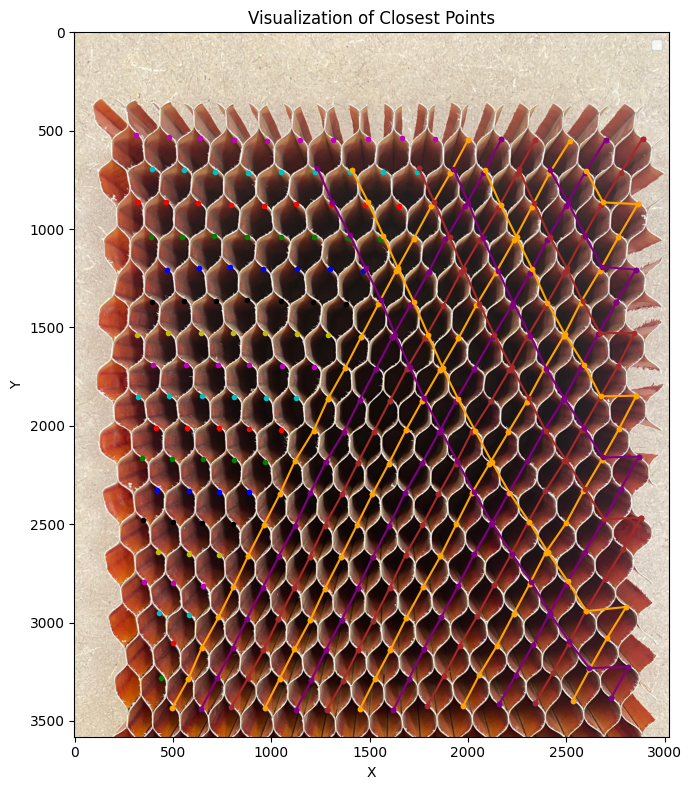

In [47]:
import math
import matplotlib.pyplot as plt
import cv2

def find_closest_points(list_of_lists, Cent3):
    if len(list_of_lists) < 2:
        return []

    first_list = list_of_lists[0]
#     second_list = K
    result = []

    def find_group(point, other_lists):
        group = [point]
        found_closest_point = False

        for j in range(1, len(other_lists)):  # Start from the second list
            closest_point = None
            min_distance = 260

            for next_point in other_lists[j]:
                if next_point[0] > point[0]:  # Find the first point with x > current point's x
                    distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                    if distance < min_distance:
                        min_distance = distance
                        closest_point = next_point
                        found_closest_point = True  # Mark that a closest point is found

            if found_closest_point:
                group.append(closest_point)
                point = closest_point  # Update current point to the found closest point for next iteration
                found_closest_point = False  # Reset for next iteration
            else:
                for next_point in Cent3[j-1]:
                    if next_point[0] < point[0]:  # Find the first point with x > current point's x
                        distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                        if distance < min_distance:
                            min_distance = distance
                            closest_point = next_point
                            found_closest_point = True  # Mark that a closest point is found

                if found_closest_point:
                    group.append(closest_point)
                    point = closest_point 
                    found_closest_point = False  # Reset for next iteration
        
        return group

    # Process the first list
    for point in first_list:
        group = find_group(point, list_of_lists)
        if len(group) > 1:  # Only add groups with more than one point
            result.append(group)

#     # Process the second list
#     for point in second_list:
#         group = find_group(point, list_of_lists)
#         if len(group) > 1:  # Only add groups with more than one point
#             result.append(group)

    return result

# Example usage:
cen6=Centroid5
cen3=Centroid2[1:]
Cent6=cen6[::-1]
Cent3=cen3[::-1]
lists=Cent6
Cen3=Cent3
resultdiag_right = find_closest_points(cen6, cen3)

# Load the image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plotting the points
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb)

# Plot all points from list_of_lists with different colors
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # List of colors for plotting
color_index = 0

for lst in Centroid5:
    x_vals = [point[0] for point in lst]
    y_vals = [point[1] for point in lst]
    plt.scatter(x_vals, y_vals, color=colors[color_index], marker='.')
    color_index = (color_index + 1) % len(colors)

# Plot grouped points found by find_closest_points with the same color
group_colors = ['orange', 'purple', 'brown']  # List of colors for grouped points
group_color_index = 0

for group in resultdiag_right:
    x_vals = [point[0] for point in group]
    y_vals = [point[1] for point in group]
    plt.plot(x_vals, y_vals, marker='.', linestyle='-', color=group_colors[group_color_index])
    plt.scatter(x_vals, y_vals, color=group_colors[group_color_index], marker='.')
    group_color_index = (group_color_index + 1) % len(group_colors)

# Adding labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Visualization of Closest Points')
plt.legend()

# Show plot
plt.tight_layout()
plt.savefig("/kaggle/working/center6.png")
plt.show()


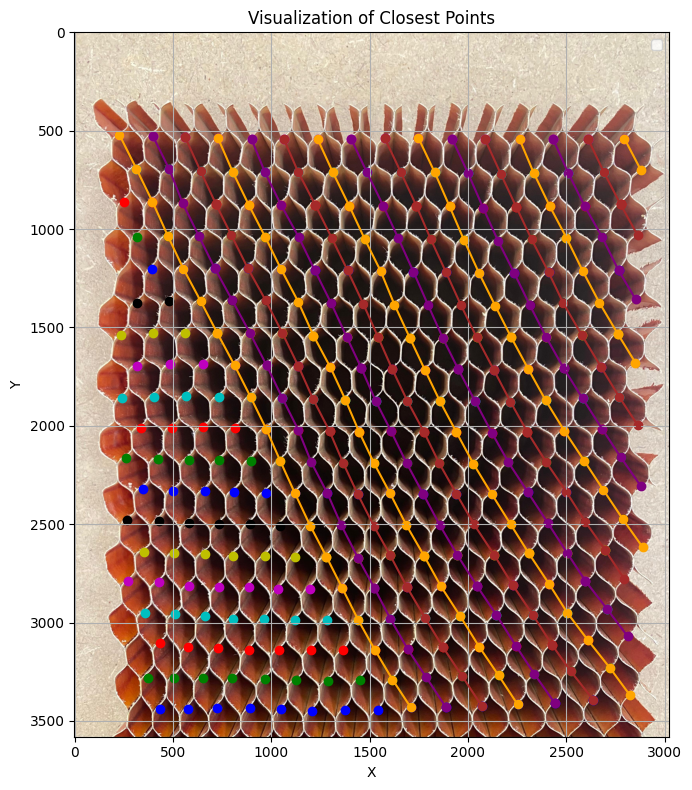

In [7]:
import math
import matplotlib.pyplot as plt
import cv2

def find_closest_points(list_of_lists, Cent3):
    if len(list_of_lists) < 2:
        return []

    first_list = list_of_lists[0]
    result = []

    for i in range(len(first_list)):
        point = first_list[i]
        group = [point]
        found_closest_point = False
        
        for j in range(1, len(list_of_lists)):  # Start from the second list
            closest_point = None
            min_distance = 260
            
            for next_point in list_of_lists[j]:
                if next_point[0] > point[0]:  # Find the first point with x > current point's x
                    distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                    if distance < min_distance:
                        min_distance = distance
                        closest_point = next_point
                        found_closest_point = True  # Mark that a closest point is found
            
            if found_closest_point:
                group.append(closest_point)
                point = closest_point  # Update current point to the found closest point for next iteration
                found_closest_point = False  # Reset for next iteration
            else:
                for next_point in Cent3[j-1]:
                    if next_point[0] > point[0]:  # Find the first point with x > current point's x
                        distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                        if distance < min_distance:
                            min_distance = distance
                            closest_point = next_point
                            found_closest_point = True  # Mark that a closest point is found

                if found_closest_point:
                    group.append(closest_point)
                    point = closest_point 
                    found_closest_point = False  # Reset for next iteration
        
        if len(group) > 1:  # Only add groups with more than one point
            result.append(group)
    
    return result

# Example usage:
cen6=Centroid6
cen3=Centroid3
Cent6=cen6[::-1]
Cent3=cen3[::-1]
lists=Cent6
Cen3=Cent3
resultdiag_right = find_closest_points(lists, Cen3)

# Load the image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plotting the points
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb)

# Plot all points from list_of_lists with different colors
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # List of colors for plotting
color_index = 0

for lst in Centroid6:
    x_vals = [point[0] for point in lst]
    y_vals = [point[1] for point in lst]
    plt.scatter(x_vals, y_vals, color=colors[color_index])
    color_index = (color_index + 1) % len(colors)

# Plot grouped points found by find_closest_points with the same color
group_colors = ['orange', 'purple', 'brown']  # List of colors for grouped points
group_color_index = 0

for group in resultdiag_right:
    x_vals = [point[0] for point in group]
    y_vals = [point[1] for point in group]
    plt.plot(x_vals, y_vals, marker='.', linestyle='-', color=group_colors[group_color_index])
    plt.scatter(x_vals, y_vals, color=group_colors[group_color_index])
    group_color_index = (group_color_index + 1) % len(group_colors)

# Adding labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Visualization of Closest Points')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.savefig('/kaggle/working/test')
plt.show()


In [8]:
coordi_last_pint_inlist = []

# Iterate over all lists in Centroid
for lst in resultdiag_right:
    if lst:  # Check if the list is not empty
        last_point = lst[-1]  # Get the last point of the current list
        coordi_last_pint_inlist.append(last_point)  # Store the coordinate (x, y) in coordinates

        # to search the coordinatethat have the near y
def group_coordinates_by_y(coordi_last_pint_inlist):
    
    grouped_coordinates = []
    current_group = []
    last_y = None
    
    for x, y in coordi_last_pint_inlist:
        if last_y is None or abs(y - last_y) <= 20:  # Adjust the tolerance as needed
            current_group.append((x, y))
        else:
            grouped_coordinates.append(current_group)
            current_group = [(x, y)]
        last_y = y
    
    if current_group:
        grouped_coordinates.append(current_group)

    return grouped_coordinates
# Print or use coordinates as needed
l=group_coordinates_by_y(coordi_last_pint_inlist)
rest=len(Centroid6[0])-len(l[0])

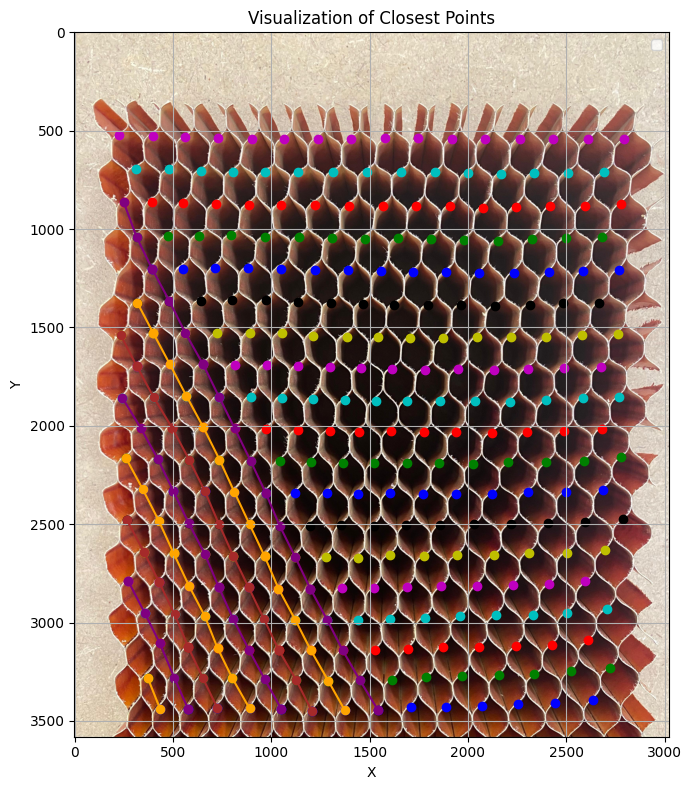

In [9]:
import math
import matplotlib.pyplot as plt
import cv2

def find_closest_points(list_of_lists, Cent3):
    if len(list_of_lists) < 2:
        return []

    first_list = Centroid6[0][:rest]
    result2 = []

    for i in range(len(first_list)):
        point = first_list[i]
        group = [point]
        found_closest_point = False
        
        for j in range(1, len(list_of_lists)):  # Start from the second list
            closest_point = None
            min_distance = 260
            
            for next_point in list_of_lists[j]:
                if next_point[0] < point[0]:  # Find the first point with x > current point's x
                    distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                    if distance < min_distance:
                        min_distance = distance
                        closest_point = next_point
                        found_closest_point = True  # Mark that a closest point is found
            
            if found_closest_point:
                group.append(closest_point)
                point = closest_point  # Update current point to the found closest point for next iteration
                found_closest_point = False  # Reset for next iteration
            else:
                for next_point in Cent3[j-2]:
                    if next_point[0] < point[0]:  # Find the first point with x > current point's x
                        distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                        if distance < min_distance:
                            min_distance = distance
                            closest_point = next_point
                            found_closest_point = True  # Mark that a closest point is found

                if found_closest_point:
                    group.append(closest_point)
                    point = closest_point 
                    found_closest_point = False  # Reset for next iteration
        
        if len(group) > 1:  # Only add groups with more than one point
            result2.append(group)
    
    return result2

# Example usage:
lists=Centroid6
tt=Centroid3
result2diag_right = find_closest_points(lists, tt)

# Load the image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plotting the points
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb)

# Plot all points from list_of_lists with different colors
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # List of colors for plotting
color_index = 0

for lst in Centroid6:
    x_vals = [point[0] for point in lst]
    y_vals = [point[1] for point in lst]
    plt.scatter(x_vals, y_vals, color=colors[color_index])
    color_index = (color_index + 1) % len(colors)

# Plot grouped points found by find_closest_points with the same color
group_colors = ['orange', 'purple', 'brown']  # List of colors for grouped points
group_color_index = 0

for group in result2diag_right:
    x_vals = [point[0] for point in group]
    y_vals = [point[1] for point in group]
    plt.plot(x_vals, y_vals, marker='.', linestyle='-', color=group_colors[group_color_index])
    plt.scatter(x_vals, y_vals, color=group_colors[group_color_index])
    group_color_index = (group_color_index + 1) % len(group_colors)

# Adding labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Visualization of Closest Points')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


# ** Diagonal left>**

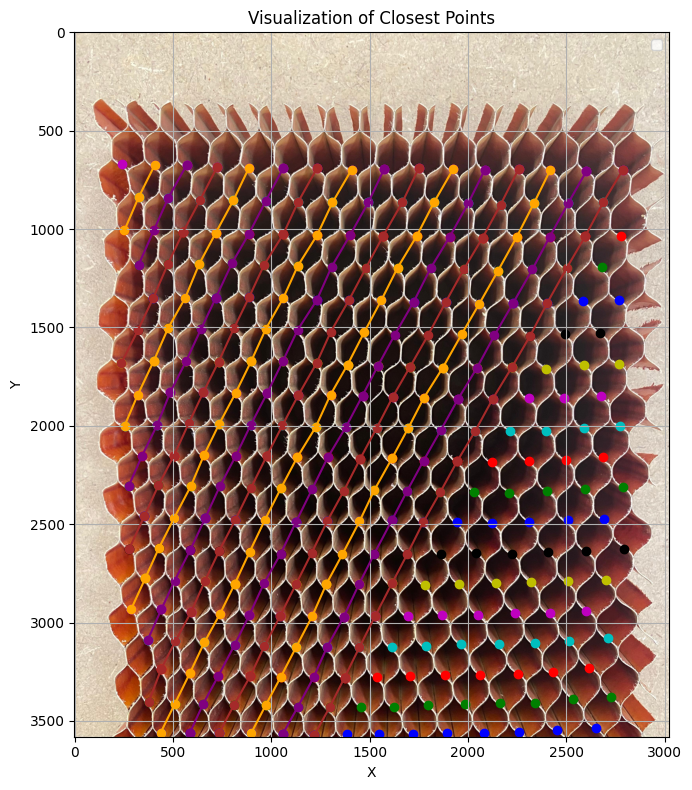

In [11]:
import math
import matplotlib.pyplot as plt
import cv2

def find_closest_points(list_of_lists, Cent3):
    if len(list_of_lists) < 2:
        return []

    first_list = list_of_lists[0]
    result = []

    for i in range(len(first_list)):
        point = first_list[i]
        group = [point]
        found_closest_point = False
        
        for j in range(1, len(list_of_lists)):  # Start from the second list
            closest_point = None
            min_distance = 260
            
            for next_point in list_of_lists[j]:
                if next_point[0] < point[0]:  # Find the first point with x > current point's x
                    distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                    if distance < min_distance:
                        min_distance = distance
                        closest_point = next_point
                        found_closest_point = True  # Mark that a closest point is found
            
            if found_closest_point:
                group.append(closest_point)
                point = closest_point  # Update current point to the found closest point for next iteration
                found_closest_point = False  # Reset for next iteration
            else:
                for next_point in Cent3[j-1]:
                    if next_point[0] < point[0]:  # Find the first point with x > current point's x
                        distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                        if distance < min_distance:
                            min_distance = distance
                            closest_point = next_point
                            found_closest_point = True  # Mark that a closest point is found

                if found_closest_point:
                    group.append(closest_point)
                    point = closest_point 
                    found_closest_point = False  # Reset for next iteration
        
        if len(group) > 1:  # Only add groups with more than one point
            result.append(group)
    
    return result

# Example usage:
cen2=Centroid2
cen5=Centroid5
Cent2=cen2[::-1]
Cent5=cen5[::-1]
Cen2=Cent2
Cen5=Cent5
resultdiag_left = find_closest_points(Cen2, Cen5)

# Load the image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plotting the points
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb)

# Plot all points from list_of_lists with different colors
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # List of colors for plotting
color_index = 0

for lst in Centroid2:
    x_vals = [point[0] for point in lst]
    y_vals = [point[1] for point in lst]
    plt.scatter(x_vals, y_vals, color=colors[color_index])
    color_index = (color_index + 1) % len(colors)

# Plot grouped points found by find_closest_points with the same color
group_colors = ['orange', 'purple', 'brown']  # List of colors for grouped points
group_color_index = 0

for group in resultdiag_left:
    x_vals = [point[0] for point in group]
    y_vals = [point[1] for point in group]
    plt.plot(x_vals, y_vals, marker='.', linestyle='-', color=group_colors[group_color_index])
    plt.scatter(x_vals, y_vals, color=group_colors[group_color_index])
    group_color_index = (group_color_index + 1) % len(group_colors)

# Adding labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Visualization of Closest Points')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


In [12]:
coordi_last_pint_inlist = []

# Iterate over all lists in Centroid
for lst in resultdiag_left:
    if lst:  # Check if the list is not empty
        last_point = lst[-1]  # Get the last point of the current list
        coordi_last_pint_inlist.append(last_point)  # Store the coordinate (x, y) in coordinates

        # to search the coordinatethat have the near y
def group_coordinates_by_y(coordi_last_pint_inlist):
    
    grouped_coordinates = []
    current_group = []
    last_y = None
    
    for x, y in coordi_last_pint_inlist:
        if last_y is None or abs(y - last_y) <= 20:  
# Adjust the tolerance as needed because the camer of teepjone is ot fix so it will be 
# image hat are in zoom or other condition so we have to adjust it
            current_group.append((x, y))
        else:
            grouped_coordinates.append(current_group)
            current_group = [(x, y)]
        last_y = y
    
    if current_group:
        grouped_coordinates.append(current_group)

    return grouped_coordinates
# Print or use coordinates as needed
l=group_coordinates_by_y(coordi_last_pint_inlist)
rest=len(l[-1])


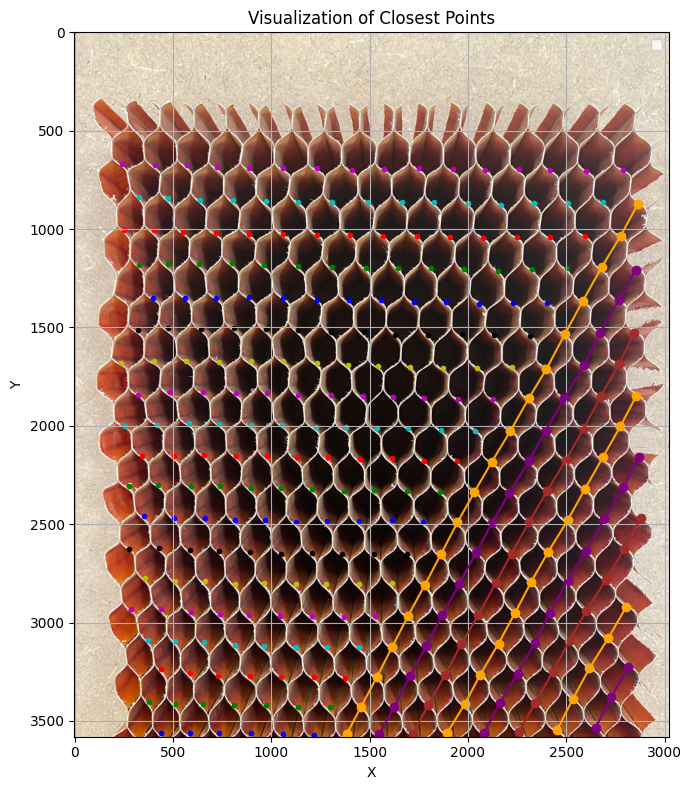

In [13]:
import math
import matplotlib.pyplot as plt
import cv2

def find_closest_points(list_of_lists, Cent3):
    if len(list_of_lists) < 2:
        return []

    first_list = Centroid2[0][rest:]
    result2 = []

    for i in range(len(first_list)):
        point = first_list[i]
        group = [point]
        found_closest_point = False
        
        for j in range(1, len(list_of_lists)):  # Start from the second list
            closest_point = None
            min_distance = 300
            
            for next_point in list_of_lists[j]:
                if next_point[0] > point[0]:  # Find the first point with x > current point's x
                    distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                    if distance < min_distance:
                        min_distance = distance
                        closest_point = next_point
                        found_closest_point = True  # Mark that a closest point is found
            
            if found_closest_point:
                group.append(closest_point)
                point = closest_point  # Update current point to the found closest point for next iteration
                found_closest_point = False  # Reset for next iteration
            else:
                for next_point in Cent3[j-2]:
                    if next_point[0] > point[0]:  # Find the first point with x > current point's x
                        distance = math.sqrt((next_point[0] - point[0])**2 + (next_point[1] - point[1])**2)
                        if distance < min_distance:
                            min_distance = distance
                            closest_point = next_point
                            found_closest_point = True  # Mark that a closest point is found

                if found_closest_point:
                    group.append(closest_point)
                    point = closest_point 
                    found_closest_point = False  # Reset for next iteration
        
        if len(group) > 1:  # Only add groups with more than one point
            result2.append(group)
    
    return result2

# Example usage:
lists=Centroid2
tt=Centroid5
result2diag_left = find_closest_points(lists, tt)

# Load the image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plotting the points
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb)

# Plot all points from list_of_lists with different colors
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # List of colors for plotting
color_index = 0

for lst in Centroid2:
    x_vals = [point[0] for point in lst]
    y_vals = [point[1] for point in lst]
    plt.scatter(x_vals, y_vals, color=colors[color_index],marker='.')
    color_index = (color_index + 1) % len(colors)

# Plot grouped points found by find_closest_points with the same color
group_colors = ['orange', 'purple', 'brown']  # List of colors for grouped points
group_color_index = 0

for group in result2diag_left:
    x_vals = [point[0] for point in group]
    y_vals = [point[1] for point in group]
    plt.plot(x_vals, y_vals, marker='.', linestyle='-', color=group_colors[group_color_index])
    plt.scatter(x_vals, y_vals, color=group_colors[group_color_index])
    group_color_index = (group_color_index + 1) % len(group_colors)

# Adding labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Visualization of Closest Points')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


# Sorted lists of the 2 diagonals

In [11]:
# Example list of coordinates
def sorted_centroid_diagonal(coordinates_lists):
    Sorted_centroid_diagonal=[]
    # Initialize an empty list to store the sorted sequences
    sorted_sequences = []

    # Process each list of coordinates
    for i, coordinates in enumerate(coordinates_lists):
        # Sort coordinates based on x-coordinate
        sorted_coordinates = sorted(coordinates, key=lambda coord: coord[0])

        # Alternately append to sorted_sequences
        if i % 2 == 0:
            sorted_sequences.append(sorted_coordinates)  # Increasing order
        else:
            sorted_sequences.append(sorted_coordinates[::-1])  # Decreasing order


    for sequence in sorted_sequences:
        Sorted_centroid_diagonal.append(sequence)
    return Sorted_centroid_diagonal
# left diagonal
# coordinates_lists_diag_left =resultdiag_left+result2diag_left
# sorted_centroid_diagonal_left=sorted_centroid_diagonal(coordinates_lists_diag_left)
# # righ diagonal
coordinates_lists_diag_right =result2diag_right +resultdiag_right
sorted_centroid_diagonal_right=sorted_centroid_diagonal(coordinates_lists_diag_right)



# **Create new points for 2 diagonals **

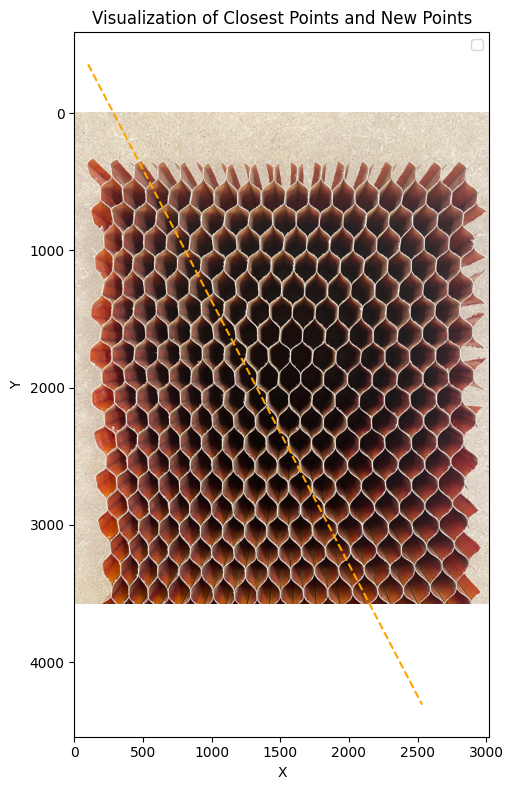

In [15]:
import math
import matplotlib.pyplot as plt
import numpy as np
import cv2

def distance(p1, p2):
    """Calculate the Euclidean distance between two points."""
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def find_closest_points(list_of_lists):
    """Find the closest points forming a linear sequence."""
    if len(list_of_lists) < 2:
        return []

    result = []
    for lst in list_of_lists:
        if len(lst) > 1:
            first_point = lst[0]
            last_point = lst[-1]
            result.append((first_point, last_point))
    return result

def extend_line(p1, p2, extension=1000):
    """Extend the line defined by p1 and p2 in both directions."""
    p1 = np.array(p1)
    p2 = np.array(p2)
    line_vector = p2 - p1
    line_vector_normalized = line_vector / np.linalg.norm(line_vector)
    
    p1_extended = p1 - extension * line_vector_normalized
    p2_extended = p2 + extension * line_vector_normalized
    
    return tuple(p1_extended), tuple(p2_extended)

def create_points_on_lines(lists, result):
    new_points = []
    
    for i, (first_point, last_point) in enumerate(result):
        p1_extended, p2_extended = extend_line(first_point, last_point)

        line_vector = np.array(p2_extended) - np.array(p1_extended)
        line_vector_normalized = line_vector / np.linalg.norm(line_vector)
        
        # Create first point 200px from the first point
        first_new_point = np.array(first_point) - 450 * line_vector_normalized
        # Adjust the y-coordinate to be smaller than the first point's y and not overlapping with existing points
        if any(np.allclose(first_new_point, point) for lst in lists for point in lst):
            first_new_point[1] = min(point[1] for lst in lists for point in lst) - 1
        
        new_points.append(tuple(first_new_point))

        # Create second point 200px from the last point
        second_new_point = np.array(last_point) + 450 * line_vector_normalized
        # Adjust the y-coordinate to be larger than the last point's y and not overlapping with existing points
        if any(np.allclose(second_new_point, point) for lst in lists for point in lst):
            second_new_point[1] = max(point[1] for lst in lists for point in lst) + 1
        
        new_points.append(tuple(second_new_point))
    
    return new_points

def plot_lines_and_points(image_path, lists, result, new_points):
    """Plot the points and the lines on the image."""
    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Plotting the points
    plt.figure(figsize=(10, 8))
    plt.imshow(image_rgb)

    # Plot all points from list_of_lists with different colors
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # List of colors for plotting
    color_index = 0

 

    # Plot grouped points found by find_closest_points with the same color
    group_colors = ['orange', 'purple', 'brown']  # List of colors for grouped points
    group_color_index = 0

    for group in result[10:11]:
        first_point, last_point = group
        p1_extended, p2_extended = extend_line(first_point, last_point)
        plt.plot([p1_extended[0], p2_extended[0]], [p1_extended[1], p2_extended[1]], linestyle='--', color=group_colors[group_color_index])
        group_color_index = (group_color_index + 1) % len(group_colors)

  

    # Adding labels and legend
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Visualization of Closest Points and New Points')
    plt.legend()

    # Show plot
    plt.savefig('/kaggle/working/result new.jpg')
    plt.tight_layout()
    plt.show()

# Example usage
# Path to your image
image_path = '/kaggle/input/uuuuoooo/test3.jpg'
# C_left = sorted_centroid_diagonal_left
# diagonal_left = find_closest_points(C_left)
# new_points_diag_left = create_points_on_lines(C_left, diagonal_left)
# plot_lines_and_points(image_path, C_left, diagonal_left, new_points_diag_left)

C_right = sorted_centroid_diagonal_right
diagonal_right = find_closest_points(C_right)
new_points_diag_right = create_points_on_lines(C_right, diagonal_right)
plot_lines_and_points(image_path, C_right, diagonal_right, new_points_diag_right)




# **Concatenate the 2 list of diagonals **

In [14]:
# List of coordinates
def interleave_lists(list1, list2):
    result = list1[:]  # Create a copy of list1 to avoid modifying it directly
    n = 1  # Start with inserting elements from list2 after the first element of list1
    
    for sublist in list2:
        if sublist[0]:
            result[n:n] = sublist  # Insert the sublist from list2 into result at position n
            n += len(sublist) + 2  # Increment n by the length of the inserted sublist + 1
        else:
            result[n:n] = sublist  # Insert the sublist from list2 into result at position n
            n += len(sublist) + 2
    
    return result


# Example usage:
# list1_left = new_points_diag_left
# list2_left = sorted_centroid_diagonal_left
list1_right=new_points_diag_right
list2_right=sorted_centroid_diagonal_right

interleaved_list_right = interleave_lists(list1_right, list2_right)
# interleaved_list_left = interleave_lists(list1_left, list2_left)

# Plot the trajectory result

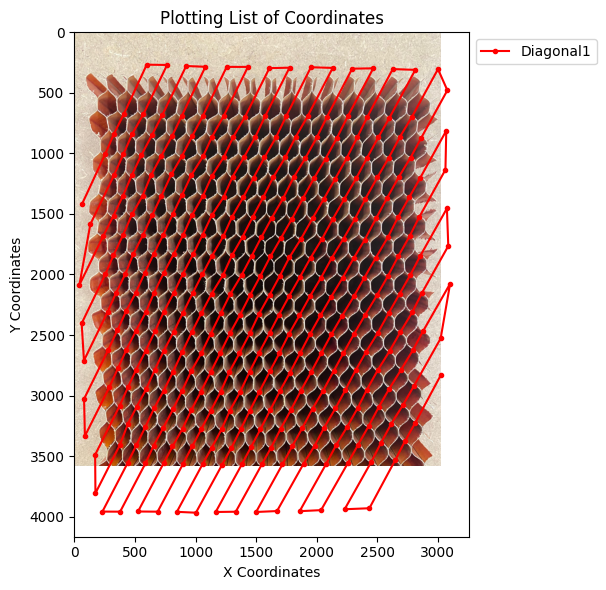

In [38]:
import matplotlib.pyplot as plt
from PIL import Image

# Example list of coordinates
interleaved_list1 = interleaved_list_left

# Example second list of coordinates
# second_list =longitudinal

interleaved_list2 = interleaved_list_right

# # Flatten the second list of lists into a simple list of coordinates
# second_list_flattened = [coord for sublist in second_list for coord in sublist]

# second_list =longitudinal

x_coords_second = [coord[0] for coord in interleaved_list1]
y_coords_second = [coord[1] for coord in interleaved_list1]

# x_coords_interleaved2 = [coord2[0] for coord2 in interleaved_list2]
# y_coords_interleaved2 = [coord2[1] for coord2 in interleaved_list2]


# Load your input image (replace 'input_image.jpg' with your image path)
image_path = '/kaggle/input/uuuuoooo/test3.jpg'
input_image = Image.open(image_path)

# Plot the image
plt.figure(figsize=(10, 6))
plt.imshow(input_image)

# Plot the points for the first list (interleaved_list) in red
plt.plot(x_coords_second, y_coords_second, marker='.', linestyle='-', color='red', label='Diagonal1')
# # Plot the points for the first list (interleaved_list) in red
# plt.plot(x_coords_interleaved2, y_coords_interleaved2, marker='.', linestyle='-', color='red', label='Diagonal2')

# # Plot the points for the second list (second_list) in blue
# plt.plot(x_coords_second, y_coords_second, marker='.', linestyle='-', color='blue', label='longitu')

# Adding labels and legend outside the image boundaries
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.title('Plotting List of Coordinates')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.savefig('/kaggle/working/result.jpg')
plt.tight_layout()
plt.show()

